# Imports & Helper Functions

In [1]:
from disent.systems.vae import HParams, VaeSystem
from disent.util import to_numpy, load_model, save_model
from disent.visualize.notebook import *
from disent.dataset import make_ground_truth_dataset
from disent import metrics

import numpy as np
import pandas as pd
import torch
from torch.utils.data import DataLoader

import imageio
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns

import os
from cachier import cachier as _cachier

# cachier with default values
def cachier(_func_=None, **kwargs):
    defaults = dict(cache_dir='data/cache', pickle_reload=False)
    defaults.update(kwargs)
    decorator = _cachier(**defaults)
    if _func_ is not None:
        return decorator(_func_)
    else:
        return decorator
    
def get_latent_outputs(system, num_samples=1000):
    means, logvars = [], []
    for i, batch in enumerate(DataLoader(system.dataset_train, batch_size=1, shuffle=True)):
        try:
            x, _ = batch
        except:
            x = batch
        z_mean, z_logvar = system.model.encode_gaussian(x.cuda())
        means.append(z_mean.cpu().detach().numpy()[0])
        logvars.append(z_logvar.cpu().detach().numpy()[0])
        if i >= num_samples:
            break
    means, logvars = np.array(means), np.array(logvars)
    return means, logvars #, np.exp(logvars).mean(axis=0)
    
def plot_system_mean_and_var(system, num_samples=100, figsize=(8, 2)):
    means, logvars = get_latent_outputs(system, num_samples)
    
    means_mean, means_std = means.mean(axis=0), means.std(axis=0)
    logvar_mean, logvar_std = logvars.mean(axis=0), logvars.std(axis=0)
    stds = np.exp(logvars) ** 0.5
    std_mean, std_std = stds.mean(axis=0), stds.std(axis=0)
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=figsize)
    
    from matplotlib.ticker import MaxNLocator
    
    ax1.set_title('z_mean')
    ax1.set_xlabel('idx')
    ax1.set_ylabel('value')
    ax1.xaxis.set_major_locator(MaxNLocator(integer=True))
    ax1.set_ylim([-2, 2])
    ax1.errorbar(np.arange(len(means_mean)) + 1, means_mean, yerr=means_std)

    ax2.set_title('z_logvar')
    ax2.set_xlabel('idx')
    ax2.set_ylabel('value')
    ax2.xaxis.set_major_locator(MaxNLocator(integer=True))
    ax2.set_ylim([-1, 1])
    ax2.errorbar(np.arange(len(logvar_mean)) + 1, logvar_mean, yerr=logvar_std)
    
    ax3.set_title('exp(z_logvar) ** 0.5')
    ax3.set_xlabel('idx')
    ax3.set_ylabel('value')
    ax3.xaxis.set_major_locator(MaxNLocator(integer=True))
    ax3.set_ylim([-0.05, 0.2])
    ax3.errorbar(np.arange(len(std_mean)) + 1, std_mean, yerr=std_std)

def train_system(loss='ada-gvae', dataset='dsprites', model='simple-fc', z_size=6, epochs=1, decay=False, steps=None, save_path=None, load_path=None, train=False, try_in_memory=False, batch_size=64):
    hparams = HParams(loss=loss, dataset=dataset, model=model, z_size=z_size, lr=0.001, weight_decay=(0.000001 if decay else 0.0), num_workers=6, batch_size=batch_size, try_in_memory=try_in_memory)
    system = VaeSystem(hparams)
    if load_path:
        # system.load_from_checkpoint(checkpoint_path=PATH)
        system = load_model(system, load_path, cuda=False)
    if train:
        trainer = system.quick_train(epochs=epochs, steps=steps)
        if save_path:
            # trainer.save_checkpoint(save_path)
            save_model(system, save_path)
    return system #, trainer

ModuleNotFoundError: No module named 'tonic'

# Visualise Datasets

In [2]:
DATASET = ['3dshapes', 'dsprites', 'xygrid'][1]

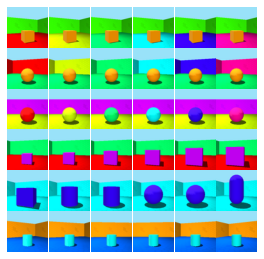

In [6]:
plt_sample_dataset_still_images(DATASET, 6)

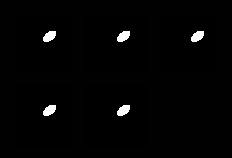

In [5]:
notebook_display_sample_dataset_animation(DATASET, 9)

# Initialise Vis Model

In [7]:
# PRE TRAINED, DONT MODIFY
system2 = train_system(loss='beta-vae', dataset='3dshapes', epochs=1, steps=None, model='simple-fc', save_path=None, load_path='data/trained-e1-3dshapes-simple-fc.ckpt', train=False)
system2 = system2.cuda()


[MODEL]: loaded data/trained-e1-3dshapes-simple-fc.ckpt (cuda: False)


# Plot Random Latent Guassian Samples

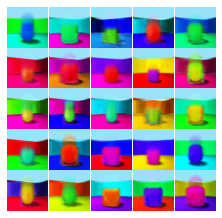

In [8]:
plt_latent_random_samples(system2, 25)

# Visualise Reconstructions

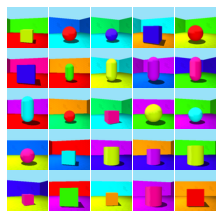

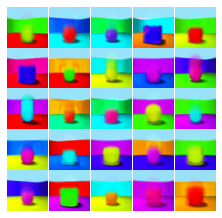

In [9]:
plt_sample_observations_and_reconstruct(system2, num_samples=25);

# Visualise Latent Traversals

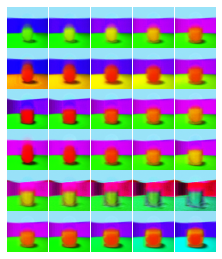

In [10]:
plt_traverse_latent_space(system2, num_samples=1, values=6, dimensions=None)

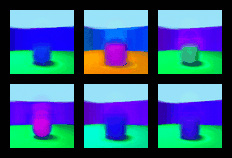

In [11]:
notebook_display_traverse_latent_space(system2, num_samples=1, values=21, dimensions=None, fps=10)

# Visualise Latent Cycles

target


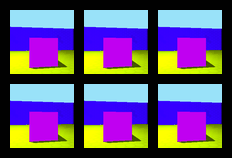

std_gaussian_cycle


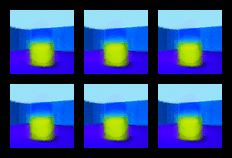

fitted_gaussian_cycle


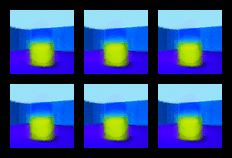

fixed_interval_cycle


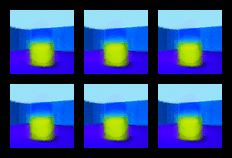

conf_interval_cycle


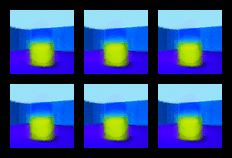

minmax_interval_cycle


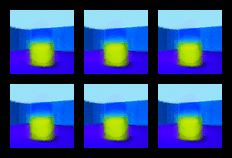

In [12]:
print('target')
notebook_display_sample_dataset_animation(DATASET, 9)

obs = torch.stack(system2.dataset_train.sample_observations(128)).cuda()
for mode in LATENT_CYCLE_MODES:
    print(mode)
    notebook_display_latent_cycle(system2, mode=mode, obs=obs)

-----------
-----------
-----------
-----------
-----------

# EXPERIMENTS - BETA VAE

In [6]:
# BETA-VAE
# PATH = 'data/models/trained-e10-3dshapes-simple-fc-z12.ckpt'
# train_system(loss='beta-vae', dataset='3dshapes', epochs=10, steps=None, model='simple-fc', z_size=12, save_path=PATH, load_path=None, train=True)

# PATH = 'data/models/trained-e10-3dshapes-simple-fc-z9-betavae.ckpt' # 3651.647
# train_system(loss='beta-vae', dataset='3dshapes', epochs=10, model='simple-fc', z_size=9, save_path=PATH, load_path=None, train=True)

# PATH = 'data/models/trained-e10-3dshapes-simple-fc-z6.ckpt'
# train_system(loss='beta-vae', dataset='3dshapes', epochs=10, steps=None, model='simple-fc', z_size=6, save_path=PATH, load_path=None, train=True)

# PATH = 'data/models/trained-e10-3dshapes-simple-fc-z3.ckpt'
# train_system(loss='beta-vae', dataset='3dshapes', epochs=10, steps=None, model='simple-fc', z_size=3, save_path=PATH, load_path=None, train=True)

[MODEL]: loaded data/trained-e10-3dshapes-simple-fc-z3.ckpt (cuda: False)


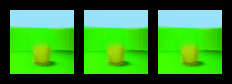

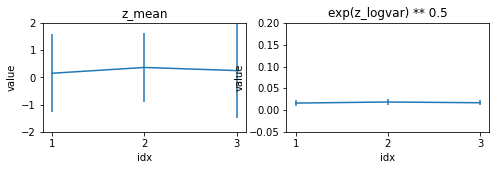

In [40]:
PATH = 'data/models/trained-e10-3dshapes-simple-fc-z3.ckpt'
system = train_system(loss='beta-vae', dataset='3dshapes', model='simple-fc', z_size=3, load_path=PATH, train=False).cuda()
notebook_display_latent_cycle(system)
plot_system_mean_and_var(system, 1000)

[MODEL]: loaded data/trained-e10-3dshapes-simple-fc-z6.ckpt (cuda: False)


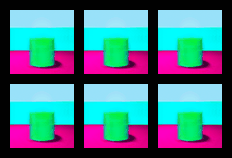

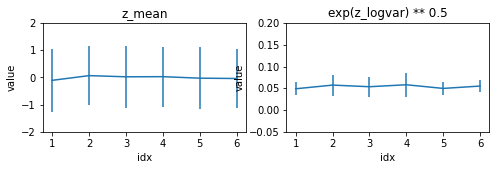

In [41]:
PATH = 'data/models/trained-e10-3dshapes-simple-fc-z6.ckpt'
system = train_system(loss='beta-vae', dataset='3dshapes', model='simple-fc', z_size=6, load_path=PATH, train=False).cuda()
notebook_display_latent_cycle(system)
plot_system_mean_and_var(system, 1000)

[MODEL]: loaded data/trained-e10-3dshapes-simple-fc-z12.ckpt (cuda: False)


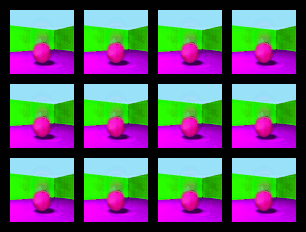

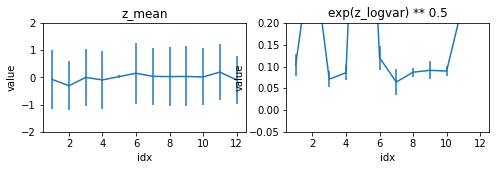

In [42]:
PATH = 'data/models/trained-e10-3dshapes-simple-fc-z12.ckpt'
system = train_system(loss='beta-vae', dataset='3dshapes', model='simple-fc', z_size=12, load_path=PATH, train=False).cuda()
notebook_display_latent_cycle(system)
plot_system_mean_and_var(system, 1000)

[MODEL]: loaded data/trained-e10-3dshapes-simple-fc-z12.ckpt (cuda: False)


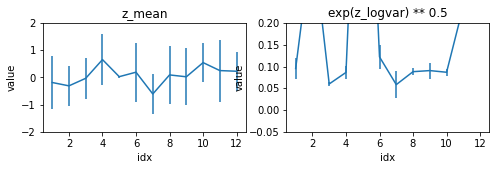

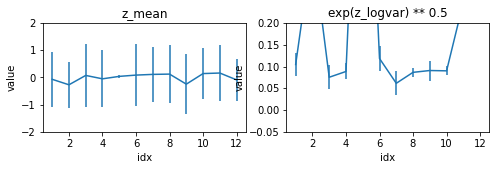

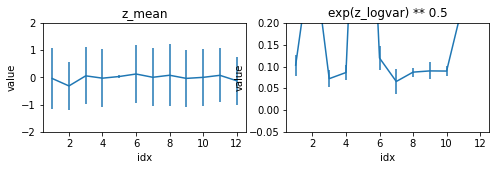

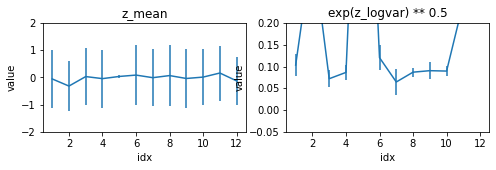

In [17]:
PATH = 'data/models/trained-e10-3dshapes-simple-fc-z12.ckpt'
system = train_system(loss='beta-vae', dataset='3dshapes', model='simple-fc', z_size=12, load_path=PATH, train=False).cuda()
# notebook_display_latent_cycle(system)
plot_system_mean_and_var(system, 10)
plot_system_mean_and_var(system, 100)
plot_system_mean_and_var(system, 1000)
plot_system_mean_and_var(system, 10000)

# EXPERIMENTS - GVAE

In [4]:
!ls data/model

temp.model
trained-e10-3dshapes-simple-fc-z12-adagvae.ckpt
trained-e10-3dshapes-simple-fc-z24-adagvae.ckpt
trained-e10-3dshapes-simple-fc-z3-adagvae.ckpt
trained-e10-3dshapes-simple-fc-z6-adagvae.ckpt
trained-e10-3dshapes-simple-fc-z9-adagvae.ckpt
trained-e10-3dshapes-simple-fc-z9-betavae.ckpt
trained-e1-3dshapes-simple-fc-z24-adagvae.ckpt


In [18]:
# PATH = 'data/models/trained-e10-3dshapes-simple-fc-z24-adagvae.ckpt' # 3944.428
# train_system(loss='ada-gvae', dataset='3dshapes', epochs=10, model='simple-fc', z_size=24, save_path=PATH, load_path=None, train=True)

# PATH = 'data/models/trained-e10-3dshapes-simple-fc-z12-adagvae.ckpt' # 7175.232 INVALID
# train_system(loss='ada-gvae', dataset='3dshapes', epochs=10, model='simple-fc', z_size=12, save_path=PATH, load_path=None, train=True)

# PATH = 'data/models/trained-e10-3dshapes-simple-fc-z9-adagvae.ckpt' # 3981.335
# train_system(loss='ada-gvae', dataset='3dshapes', epochs=10, model='simple-fc', z_size=9, save_path=PATH, load_path=None, train=True)

# PATH = 'data/models/trained-e10-3dshapes-simple-fc-z6-adagvae.ckpt' # 7165.487 INVALID
# train_system(loss='ada-gvae', dataset='3dshapes', epochs=10, model='simple-fc', z_size=6, save_path=PATH, load_path=None, train=True)

# PATH = 'data/models/trained-e10-3dshapes-simple-fc-z3-adagvae.ckpt' # 7825.952 INVALID
# train_system(loss='ada-gvae', dataset='3dshapes', epochs=10, model='simple-fc', z_size=3, save_path=PATH, load_path=None, train=True)

INFO:lightning:GPU available: True, used: True
INFO:lightning:VISIBLE GPUS: 0
INFO:lightning:
   | Name                               | Type                        | Params
-------------------------------------------------------------------------------
0  | model                              | GaussianEncoderDecoderModel | 4 M   
1  | model._gaussian_encoder            | EncoderSimpleFC             | 2 M   
2  | model._gaussian_encoder.model      | Sequential                  | 2 M   
3  | model._gaussian_encoder.model.0    | Flatten3D                   | 0     
4  | model._gaussian_encoder.model.1    | Linear                      | 2 M   
5  | model._gaussian_encoder.model.2    | ReLU                        | 0     
6  | model._gaussian_encoder.model.3    | Linear                      | 24 K  
7  | model._gaussian_encoder.model.4    | ReLU                        | 0     
8  | model._gaussian_encoder.enc3mean   | Linear                      | 1 K   
9  | model._gaussian_encoder.enc3log

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceed


[MODEL]: saved data/model/trained-e10-3dshapes-simple-fc-z12-adagvae.ckpt


VaeSystem(
  (model): GaussianEncoderDecoderModel(
    (_gaussian_encoder): EncoderSimpleFC(
      (model): Sequential(
        (0): Flatten3D()
        (1): Linear(in_features=12288, out_features=192, bias=True)
        (2): ReLU(inplace=True)
        (3): Linear(in_features=192, out_features=128, bias=True)
        (4): ReLU(inplace=True)
      )
      (enc3mean): Linear(in_features=128, out_features=12, bias=True)
      (enc3logvar): Linear(in_features=128, out_features=12, bias=True)
    )
    (_decoder): DecoderSimpleFC(
      (model): Sequential(
        (0): Linear(in_features=12, out_features=128, bias=True)
        (1): ReLU(inplace=True)
        (2): Linear(in_features=128, out_features=192, bias=True)
        (3): ReLU(inplace=True)
        (4): Linear(in_features=192, out_features=12288, bias=True)
        (5): View()
      )
    )
  )
)

INFO:lightning:GPU available: True, used: True
INFO:lightning:VISIBLE GPUS: 0
INFO:lightning:
   | Name                               | Type                        | Params
-------------------------------------------------------------------------------
0  | model                              | GaussianEncoderDecoderModel | 4 M   
1  | model._gaussian_encoder            | EncoderSimpleFC             | 2 M   
2  | model._gaussian_encoder.model      | Sequential                  | 2 M   
3  | model._gaussian_encoder.model.0    | Flatten3D                   | 0     
4  | model._gaussian_encoder.model.1    | Linear                      | 2 M   
5  | model._gaussian_encoder.model.2    | ReLU                        | 0     
6  | model._gaussian_encoder.model.3    | Linear                      | 24 K  
7  | model._gaussian_encoder.model.4    | ReLU                        | 0     
8  | model._gaussian_encoder.enc3mean   | Linear                      | 774   
9  | model._gaussian_encoder.enc3log


[MODEL]: saved data/model/trained-e10-3dshapes-simple-fc-z6-adagvae.ckpt


VaeSystem(
  (model): GaussianEncoderDecoderModel(
    (_gaussian_encoder): EncoderSimpleFC(
      (model): Sequential(
        (0): Flatten3D()
        (1): Linear(in_features=12288, out_features=192, bias=True)
        (2): ReLU(inplace=True)
        (3): Linear(in_features=192, out_features=128, bias=True)
        (4): ReLU(inplace=True)
      )
      (enc3mean): Linear(in_features=128, out_features=6, bias=True)
      (enc3logvar): Linear(in_features=128, out_features=6, bias=True)
    )
    (_decoder): DecoderSimpleFC(
      (model): Sequential(
        (0): Linear(in_features=6, out_features=128, bias=True)
        (1): ReLU(inplace=True)
        (2): Linear(in_features=128, out_features=192, bias=True)
        (3): ReLU(inplace=True)
        (4): Linear(in_features=192, out_features=12288, bias=True)
        (5): View()
      )
    )
  )
)

INFO:lightning:GPU available: True, used: True
INFO:lightning:VISIBLE GPUS: 0
INFO:lightning:
   | Name                               | Type                        | Params
-------------------------------------------------------------------------------
0  | model                              | GaussianEncoderDecoderModel | 4 M   
1  | model._gaussian_encoder            | EncoderSimpleFC             | 2 M   
2  | model._gaussian_encoder.model      | Sequential                  | 2 M   
3  | model._gaussian_encoder.model.0    | Flatten3D                   | 0     
4  | model._gaussian_encoder.model.1    | Linear                      | 2 M   
5  | model._gaussian_encoder.model.2    | ReLU                        | 0     
6  | model._gaussian_encoder.model.3    | Linear                      | 24 K  
7  | model._gaussian_encoder.model.4    | ReLU                        | 0     
8  | model._gaussian_encoder.enc3mean   | Linear                      | 387   
9  | model._gaussian_encoder.enc3log


[MODEL]: saved data/model/trained-e10-3dshapes-simple-fc-z3-adagvae.ckpt


VaeSystem(
  (model): GaussianEncoderDecoderModel(
    (_gaussian_encoder): EncoderSimpleFC(
      (model): Sequential(
        (0): Flatten3D()
        (1): Linear(in_features=12288, out_features=192, bias=True)
        (2): ReLU(inplace=True)
        (3): Linear(in_features=192, out_features=128, bias=True)
        (4): ReLU(inplace=True)
      )
      (enc3mean): Linear(in_features=128, out_features=3, bias=True)
      (enc3logvar): Linear(in_features=128, out_features=3, bias=True)
    )
    (_decoder): DecoderSimpleFC(
      (model): Sequential(
        (0): Linear(in_features=3, out_features=128, bias=True)
        (1): ReLU(inplace=True)
        (2): Linear(in_features=128, out_features=192, bias=True)
        (3): ReLU(inplace=True)
        (4): Linear(in_features=192, out_features=12288, bias=True)
        (5): View()
      )
    )
  )
)

[MODEL]: loaded data/model/trained-e10-3dshapes-simple-fc-z24-adagvae.ckpt (cuda: False)


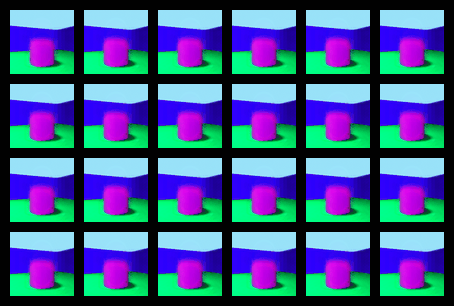

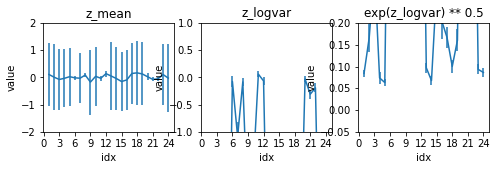

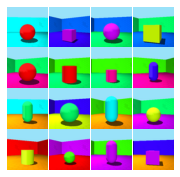

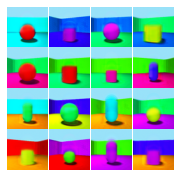

In [17]:
PATH = 'data/models/trained-e10-3dshapes-simple-fc-z24-adagvae.ckpt'
system = train_system(loss='ada-gvae', dataset='3dshapes', model='simple-fc', z_size=24, load_path=PATH, train=False).cuda()
notebook_display_latent_cycle(system)
plot_system_mean_and_var(system, 1000)
plt_sample_observations_and_reconstruct(system, num_samples=16);

[MODEL]: loaded data/model/trained-e10-3dshapes-simple-fc-z12-adagvae.ckpt (cuda: False)


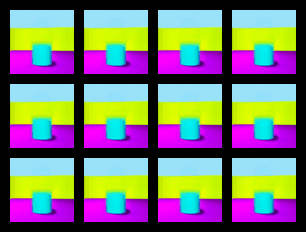

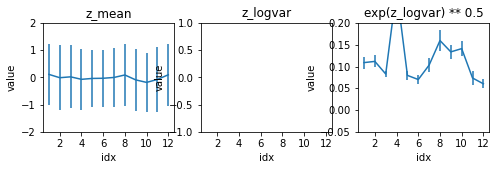

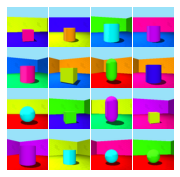

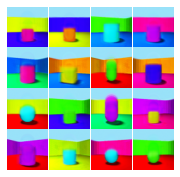

In [19]:
PATH = 'data/models/trained-e10-3dshapes-simple-fc-z12-adagvae.ckpt'
system = train_system(loss='ada-gvae', dataset='3dshapes', model='simple-fc', z_size=12, load_path=PATH, train=False).cuda()
notebook_display_latent_cycle(system)
plot_system_mean_and_var(system, 1000)
plt_sample_observations_and_reconstruct(system, num_samples=16);

[MODEL]: loaded data/model/trained-e10-3dshapes-simple-fc-z6-adagvae.ckpt (cuda: False)


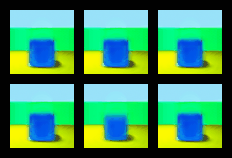

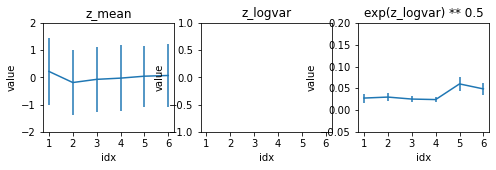

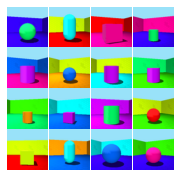

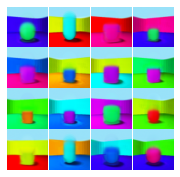

In [20]:
PATH = 'data/models/trained-e10-3dshapes-simple-fc-z6-adagvae.ckpt'
system = train_system(loss='ada-gvae', dataset='3dshapes', model='simple-fc', z_size=6, load_path=PATH, train=False).cuda()
notebook_display_latent_cycle(system)
plot_system_mean_and_var(system, 1000)
plt_sample_observations_and_reconstruct(system, num_samples=16);

[MODEL]: loaded data/model/trained-e10-3dshapes-simple-fc-z3-adagvae.ckpt (cuda: False)


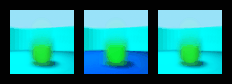

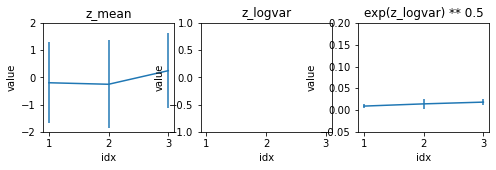

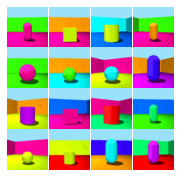

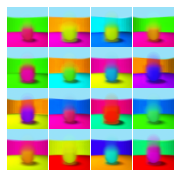

In [21]:
PATH = 'data/models/trained-e10-3dshapes-simple-fc-z3-adagvae.ckpt'
system = train_system(loss='ada-gvae', dataset='3dshapes', model='simple-fc', z_size=3, load_path=PATH, train=False).cuda()
notebook_display_latent_cycle(system)
plot_system_mean_and_var(system, 1000)
plt_sample_observations_and_reconstruct(system, num_samples=16);

# Visualise DSprites

In [6]:
# PATH = 'data/trained-e10-dsprites-simple-fc-z24-adagvae.ckpt'
# train_system(loss='ada-gvae', dataset='dsprites', epochs=10, model='simple-fc', z_size=24, save_path=PATH, load_path=None, train=True)

# PATH = 'data/trained-e10-dsprites-simple-fc-z12-adagvae.ckpt' # 7175.232
# train_system(loss='ada-gvae', dataset='dsprites', epochs=10, model='simple-fc', z_size=12, save_path=PATH, load_path=None, train=True)

# PATH = 'data/trained-e10-dsprites-simple-fc-z9-adagvae.ckpt' #
# train_system(loss='ada-gvae', dataset='dsprites', epochs=10, model='simple-fc', z_size=9, save_path=PATH, load_path=None, train=True)

# PATH = 'data/trained-e10-dsprites-simple-fc-z6-adagvae.ckpt' # 7165.487
# train_system(loss='ada-gvae', dataset='dsprites', epochs=10, model='simple-fc', z_size=6, save_path=PATH, load_path=None, train=True)

# PATH = 'data/trained-e10-dsprites-simple-fc-z3-adagvae.ckpt' # 7825.952
# train_system(loss='ada-gvae', dataset='dsprites', epochs=10, model='simple-fc', z_size=3, save_path=PATH, load_path=None, train=True)


# PATH = 'data/trained-e10-dsprites-simple-fc-z24-betavae.ckpt'
# train_system(loss='ada-gvae', dataset='dsprites', epochs=10, model='simple-fc', z_size=24, save_path=PATH, load_path=None, train=True)

# PATH = 'data/trained-e10-dsprites-simple-fc-z12-betavae.ckpt' # 7175.232
# train_system(loss='ada-gvae', dataset='dsprites', epochs=10, model='simple-fc', z_size=12, save_path=PATH, load_path=None, train=True)

# PATH = 'data/trained-e10-dsprites-simple-fc-z9-betavae.ckpt' #
# train_system(loss='ada-gvae', dataset='dsprites', epochs=10, model='simple-fc', z_size=9, save_path=PATH, load_path=None, train=True)

# PATH = 'data/trained-e10-dsprites-simple-fc-z6-betavae.ckpt' # 7165.487
# train_system(loss='ada-gvae', dataset='dsprites', epochs=10, model='simple-fc', z_size=6, save_path=PATH, load_path=None, train=True)

# PATH = 'data/trained-e10-dsprites-simple-fc-z3-betavae.ckpt' # 7825.952
# train_system(loss='ada-gvae', dataset='dsprites', epochs=10, model='simple-fc', z_size=3, save_path=PATH, load_path=None, train=True)

[DATASET: DSpritesData]: Loading... 

INFO:lightning:GPU available: True, used: True
INFO:lightning:VISIBLE GPUS: 0


Loaded!


INFO:lightning:
   | Name                               | Type                 | Params
------------------------------------------------------------------------
0  | model                              | GaussianEncoderModel | 4 M   
1  | model._gaussian_encoder            | EncoderSimpleFC      | 2 M   
2  | model._gaussian_encoder.model      | Sequential           | 2 M   
3  | model._gaussian_encoder.model.0    | Flatten3D            | 0     
4  | model._gaussian_encoder.model.1    | Linear               | 2 M   
5  | model._gaussian_encoder.model.2    | ReLU                 | 0     
6  | model._gaussian_encoder.model.3    | Linear               | 24 K  
7  | model._gaussian_encoder.model.4    | ReLU                 | 0     
8  | model._gaussian_encoder.enc3mean   | Linear               | 3 K   
9  | model._gaussian_encoder.enc3logvar | Linear               | 3 K   
10 | model._decoder                     | DecoderSimpleFC      | 2 M   
11 | model._decoder.model               | Seque

/home/nmichlo/.pyenv/versions/miniconda3-latest/envs/disentangle/lib/python3.8/site-packages/pytorch_lightning/utilities/warnings.py:18: RuntimeWarning: Displayed epoch numbers in the progress bar start from "1" until v0.6.x, but will start from "0" in v0.8.0.
  warnings.warn(*args, **kwargs)



[MODEL]: saved data/trained-e10-dsprites-simple-fc-z24-adagvae.ckpt


VaeSystem(
  (model): GaussianEncoderModel(
    (_gaussian_encoder): EncoderSimpleFC(
      (model): Sequential(
        (0): Flatten3D()
        (1): Linear(in_features=12288, out_features=192, bias=True)
        (2): ReLU(inplace=True)
        (3): Linear(in_features=192, out_features=128, bias=True)
        (4): ReLU(inplace=True)
      )
      (enc3mean): Linear(in_features=128, out_features=24, bias=True)
      (enc3logvar): Linear(in_features=128, out_features=24, bias=True)
    )
    (_decoder): DecoderSimpleFC(
      (model): Sequential(
        (0): Linear(in_features=24, out_features=128, bias=True)
        (1): ReLU(inplace=True)
        (2): Linear(in_features=128, out_features=192, bias=True)
        (3): ReLU(inplace=True)
        (4): Linear(in_features=192, out_features=12288, bias=True)
        (5): View()
      )
    )
  )
)

INFO:lightning:GPU available: True, used: True
INFO:lightning:VISIBLE GPUS: 0
INFO:lightning:
   | Name                               | Type                 | Params
------------------------------------------------------------------------
0  | model                              | GaussianEncoderModel | 4 M   
1  | model._gaussian_encoder            | EncoderSimpleFC      | 2 M   
2  | model._gaussian_encoder.model      | Sequential           | 2 M   
3  | model._gaussian_encoder.model.0    | Flatten3D            | 0     
4  | model._gaussian_encoder.model.1    | Linear               | 2 M   
5  | model._gaussian_encoder.model.2    | ReLU                 | 0     
6  | model._gaussian_encoder.model.3    | Linear               | 24 K  
7  | model._gaussian_encoder.model.4    | ReLU                 | 0     
8  | model._gaussian_encoder.enc3mean   | Linear               | 1 K   
9  | model._gaussian_encoder.enc3logvar | Linear               | 1 K   
10 | model._decoder                     |


[MODEL]: saved data/trained-e10-dsprites-simple-fc-z12-adagvae.ckpt


VaeSystem(
  (model): GaussianEncoderModel(
    (_gaussian_encoder): EncoderSimpleFC(
      (model): Sequential(
        (0): Flatten3D()
        (1): Linear(in_features=12288, out_features=192, bias=True)
        (2): ReLU(inplace=True)
        (3): Linear(in_features=192, out_features=128, bias=True)
        (4): ReLU(inplace=True)
      )
      (enc3mean): Linear(in_features=128, out_features=12, bias=True)
      (enc3logvar): Linear(in_features=128, out_features=12, bias=True)
    )
    (_decoder): DecoderSimpleFC(
      (model): Sequential(
        (0): Linear(in_features=12, out_features=128, bias=True)
        (1): ReLU(inplace=True)
        (2): Linear(in_features=128, out_features=192, bias=True)
        (3): ReLU(inplace=True)
        (4): Linear(in_features=192, out_features=12288, bias=True)
        (5): View()
      )
    )
  )
)

INFO:lightning:GPU available: True, used: True
INFO:lightning:VISIBLE GPUS: 0
INFO:lightning:
   | Name                               | Type                 | Params
------------------------------------------------------------------------
0  | model                              | GaussianEncoderModel | 4 M   
1  | model._gaussian_encoder            | EncoderSimpleFC      | 2 M   
2  | model._gaussian_encoder.model      | Sequential           | 2 M   
3  | model._gaussian_encoder.model.0    | Flatten3D            | 0     
4  | model._gaussian_encoder.model.1    | Linear               | 2 M   
5  | model._gaussian_encoder.model.2    | ReLU                 | 0     
6  | model._gaussian_encoder.model.3    | Linear               | 24 K  
7  | model._gaussian_encoder.model.4    | ReLU                 | 0     
8  | model._gaussian_encoder.enc3mean   | Linear               | 774   
9  | model._gaussian_encoder.enc3logvar | Linear               | 774   
10 | model._decoder                     |


[MODEL]: saved data/trained-e10-dsprites-simple-fc-z6-adagvae.ckpt


VaeSystem(
  (model): GaussianEncoderModel(
    (_gaussian_encoder): EncoderSimpleFC(
      (model): Sequential(
        (0): Flatten3D()
        (1): Linear(in_features=12288, out_features=192, bias=True)
        (2): ReLU(inplace=True)
        (3): Linear(in_features=192, out_features=128, bias=True)
        (4): ReLU(inplace=True)
      )
      (enc3mean): Linear(in_features=128, out_features=6, bias=True)
      (enc3logvar): Linear(in_features=128, out_features=6, bias=True)
    )
    (_decoder): DecoderSimpleFC(
      (model): Sequential(
        (0): Linear(in_features=6, out_features=128, bias=True)
        (1): ReLU(inplace=True)
        (2): Linear(in_features=128, out_features=192, bias=True)
        (3): ReLU(inplace=True)
        (4): Linear(in_features=192, out_features=12288, bias=True)
        (5): View()
      )
    )
  )
)

INFO:lightning:GPU available: True, used: True
INFO:lightning:VISIBLE GPUS: 0
INFO:lightning:
   | Name                               | Type                 | Params
------------------------------------------------------------------------
0  | model                              | GaussianEncoderModel | 4 M   
1  | model._gaussian_encoder            | EncoderSimpleFC      | 2 M   
2  | model._gaussian_encoder.model      | Sequential           | 2 M   
3  | model._gaussian_encoder.model.0    | Flatten3D            | 0     
4  | model._gaussian_encoder.model.1    | Linear               | 2 M   
5  | model._gaussian_encoder.model.2    | ReLU                 | 0     
6  | model._gaussian_encoder.model.3    | Linear               | 24 K  
7  | model._gaussian_encoder.model.4    | ReLU                 | 0     
8  | model._gaussian_encoder.enc3mean   | Linear               | 387   
9  | model._gaussian_encoder.enc3logvar | Linear               | 387   
10 | model._decoder                     |


[MODEL]: saved data/trained-e10-dsprites-simple-fc-z3-adagvae.ckpt


VaeSystem(
  (model): GaussianEncoderModel(
    (_gaussian_encoder): EncoderSimpleFC(
      (model): Sequential(
        (0): Flatten3D()
        (1): Linear(in_features=12288, out_features=192, bias=True)
        (2): ReLU(inplace=True)
        (3): Linear(in_features=192, out_features=128, bias=True)
        (4): ReLU(inplace=True)
      )
      (enc3mean): Linear(in_features=128, out_features=3, bias=True)
      (enc3logvar): Linear(in_features=128, out_features=3, bias=True)
    )
    (_decoder): DecoderSimpleFC(
      (model): Sequential(
        (0): Linear(in_features=3, out_features=128, bias=True)
        (1): ReLU(inplace=True)
        (2): Linear(in_features=128, out_features=192, bias=True)
        (3): ReLU(inplace=True)
        (4): Linear(in_features=192, out_features=12288, bias=True)
        (5): View()
      )
    )
  )
)

INFO:lightning:GPU available: True, used: True
INFO:lightning:VISIBLE GPUS: 0
INFO:lightning:
   | Name                               | Type                 | Params
------------------------------------------------------------------------
0  | model                              | GaussianEncoderModel | 4 M   
1  | model._gaussian_encoder            | EncoderSimpleFC      | 2 M   
2  | model._gaussian_encoder.model      | Sequential           | 2 M   
3  | model._gaussian_encoder.model.0    | Flatten3D            | 0     
4  | model._gaussian_encoder.model.1    | Linear               | 2 M   
5  | model._gaussian_encoder.model.2    | ReLU                 | 0     
6  | model._gaussian_encoder.model.3    | Linear               | 24 K  
7  | model._gaussian_encoder.model.4    | ReLU                 | 0     
8  | model._gaussian_encoder.enc3mean   | Linear               | 3 K   
9  | model._gaussian_encoder.enc3logvar | Linear               | 3 K   
10 | model._decoder                     |


[MODEL]: saved data/trained-e10-dsprites-simple-fc-z24-betavae.ckpt


VaeSystem(
  (model): GaussianEncoderModel(
    (_gaussian_encoder): EncoderSimpleFC(
      (model): Sequential(
        (0): Flatten3D()
        (1): Linear(in_features=12288, out_features=192, bias=True)
        (2): ReLU(inplace=True)
        (3): Linear(in_features=192, out_features=128, bias=True)
        (4): ReLU(inplace=True)
      )
      (enc3mean): Linear(in_features=128, out_features=24, bias=True)
      (enc3logvar): Linear(in_features=128, out_features=24, bias=True)
    )
    (_decoder): DecoderSimpleFC(
      (model): Sequential(
        (0): Linear(in_features=24, out_features=128, bias=True)
        (1): ReLU(inplace=True)
        (2): Linear(in_features=128, out_features=192, bias=True)
        (3): ReLU(inplace=True)
        (4): Linear(in_features=192, out_features=12288, bias=True)
        (5): View()
      )
    )
  )
)

INFO:lightning:GPU available: True, used: True
INFO:lightning:VISIBLE GPUS: 0
INFO:lightning:
   | Name                               | Type                 | Params
------------------------------------------------------------------------
0  | model                              | GaussianEncoderModel | 4 M   
1  | model._gaussian_encoder            | EncoderSimpleFC      | 2 M   
2  | model._gaussian_encoder.model      | Sequential           | 2 M   
3  | model._gaussian_encoder.model.0    | Flatten3D            | 0     
4  | model._gaussian_encoder.model.1    | Linear               | 2 M   
5  | model._gaussian_encoder.model.2    | ReLU                 | 0     
6  | model._gaussian_encoder.model.3    | Linear               | 24 K  
7  | model._gaussian_encoder.model.4    | ReLU                 | 0     
8  | model._gaussian_encoder.enc3mean   | Linear               | 1 K   
9  | model._gaussian_encoder.enc3logvar | Linear               | 1 K   
10 | model._decoder                     |


[MODEL]: saved data/trained-e10-dsprites-simple-fc-z12-betavae.ckpt


VaeSystem(
  (model): GaussianEncoderModel(
    (_gaussian_encoder): EncoderSimpleFC(
      (model): Sequential(
        (0): Flatten3D()
        (1): Linear(in_features=12288, out_features=192, bias=True)
        (2): ReLU(inplace=True)
        (3): Linear(in_features=192, out_features=128, bias=True)
        (4): ReLU(inplace=True)
      )
      (enc3mean): Linear(in_features=128, out_features=12, bias=True)
      (enc3logvar): Linear(in_features=128, out_features=12, bias=True)
    )
    (_decoder): DecoderSimpleFC(
      (model): Sequential(
        (0): Linear(in_features=12, out_features=128, bias=True)
        (1): ReLU(inplace=True)
        (2): Linear(in_features=128, out_features=192, bias=True)
        (3): ReLU(inplace=True)
        (4): Linear(in_features=192, out_features=12288, bias=True)
        (5): View()
      )
    )
  )
)

INFO:lightning:GPU available: True, used: True
INFO:lightning:VISIBLE GPUS: 0
INFO:lightning:
   | Name                               | Type                 | Params
------------------------------------------------------------------------
0  | model                              | GaussianEncoderModel | 4 M   
1  | model._gaussian_encoder            | EncoderSimpleFC      | 2 M   
2  | model._gaussian_encoder.model      | Sequential           | 2 M   
3  | model._gaussian_encoder.model.0    | Flatten3D            | 0     
4  | model._gaussian_encoder.model.1    | Linear               | 2 M   
5  | model._gaussian_encoder.model.2    | ReLU                 | 0     
6  | model._gaussian_encoder.model.3    | Linear               | 24 K  
7  | model._gaussian_encoder.model.4    | ReLU                 | 0     
8  | model._gaussian_encoder.enc3mean   | Linear               | 774   
9  | model._gaussian_encoder.enc3logvar | Linear               | 774   
10 | model._decoder                     |


[MODEL]: saved data/trained-e10-dsprites-simple-fc-z6-betavae.ckpt


VaeSystem(
  (model): GaussianEncoderModel(
    (_gaussian_encoder): EncoderSimpleFC(
      (model): Sequential(
        (0): Flatten3D()
        (1): Linear(in_features=12288, out_features=192, bias=True)
        (2): ReLU(inplace=True)
        (3): Linear(in_features=192, out_features=128, bias=True)
        (4): ReLU(inplace=True)
      )
      (enc3mean): Linear(in_features=128, out_features=6, bias=True)
      (enc3logvar): Linear(in_features=128, out_features=6, bias=True)
    )
    (_decoder): DecoderSimpleFC(
      (model): Sequential(
        (0): Linear(in_features=6, out_features=128, bias=True)
        (1): ReLU(inplace=True)
        (2): Linear(in_features=128, out_features=192, bias=True)
        (3): ReLU(inplace=True)
        (4): Linear(in_features=192, out_features=12288, bias=True)
        (5): View()
      )
    )
  )
)

INFO:lightning:GPU available: True, used: True
INFO:lightning:VISIBLE GPUS: 0
INFO:lightning:
   | Name                               | Type                 | Params
------------------------------------------------------------------------
0  | model                              | GaussianEncoderModel | 4 M   
1  | model._gaussian_encoder            | EncoderSimpleFC      | 2 M   
2  | model._gaussian_encoder.model      | Sequential           | 2 M   
3  | model._gaussian_encoder.model.0    | Flatten3D            | 0     
4  | model._gaussian_encoder.model.1    | Linear               | 2 M   
5  | model._gaussian_encoder.model.2    | ReLU                 | 0     
6  | model._gaussian_encoder.model.3    | Linear               | 24 K  
7  | model._gaussian_encoder.model.4    | ReLU                 | 0     
8  | model._gaussian_encoder.enc3mean   | Linear               | 387   
9  | model._gaussian_encoder.enc3logvar | Linear               | 387   
10 | model._decoder                     |


[MODEL]: saved data/trained-e10-dsprites-simple-fc-z3-betavae.ckpt


VaeSystem(
  (model): GaussianEncoderModel(
    (_gaussian_encoder): EncoderSimpleFC(
      (model): Sequential(
        (0): Flatten3D()
        (1): Linear(in_features=12288, out_features=192, bias=True)
        (2): ReLU(inplace=True)
        (3): Linear(in_features=192, out_features=128, bias=True)
        (4): ReLU(inplace=True)
      )
      (enc3mean): Linear(in_features=128, out_features=3, bias=True)
      (enc3logvar): Linear(in_features=128, out_features=3, bias=True)
    )
    (_decoder): DecoderSimpleFC(
      (model): Sequential(
        (0): Linear(in_features=3, out_features=128, bias=True)
        (1): ReLU(inplace=True)
        (2): Linear(in_features=128, out_features=192, bias=True)
        (3): ReLU(inplace=True)
        (4): Linear(in_features=192, out_features=12288, bias=True)
        (5): View()
      )
    )
  )
)

[MODEL]: loaded data/trained-e10-dsprites-simple-fc-z24-adagvae.ckpt (cuda: False)


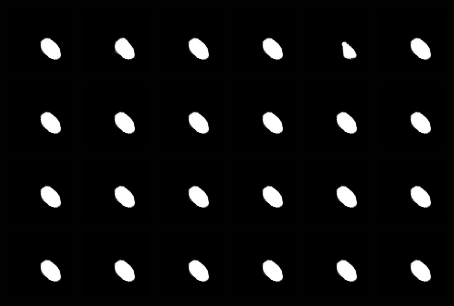

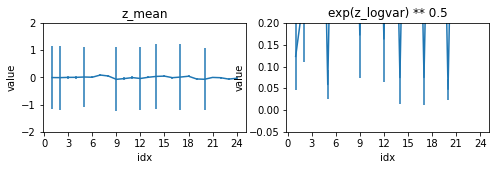

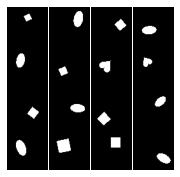

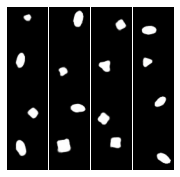

In [8]:
PATH = 'data/trained-e10-dsprites-simple-fc-z24-adagvae.ckpt'
system = train_system(loss='ada-gvae', dataset='dsprites', model='simple-fc', z_size=24, load_path=PATH, train=False).cuda()
notebook_display_latent_cycle(system)
plot_system_mean_and_var(system, 1000)
plt_sample_observations_and_reconstruct(system, num_samples=16);

[MODEL]: loaded data/trained-e10-dsprites-simple-fc-z24-betavae.ckpt (cuda: False)


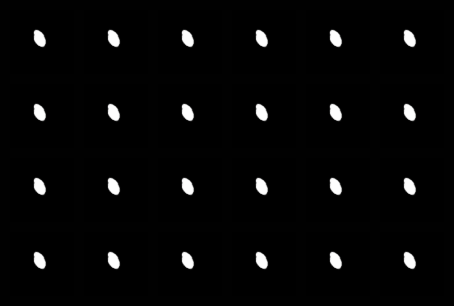

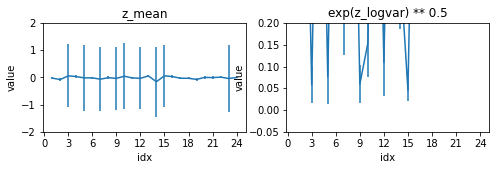

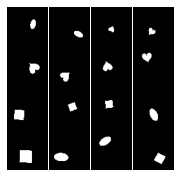

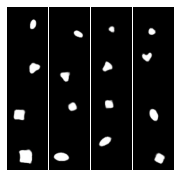

In [9]:
PATH = 'data/trained-e10-dsprites-simple-fc-z24-betavae.ckpt'
system = train_system(loss='beta-vae', dataset='dsprites', model='simple-fc', z_size=24, load_path=PATH, train=False).cuda()
notebook_display_latent_cycle(system)
plot_system_mean_and_var(system, 1000)
plt_sample_observations_and_reconstruct(system, num_samples=16);

# Metrics

### Factor Vae Score

In [5]:
@cachier
def get_factor_vae_scores(dataset='3dshapes'):
    scores_factor_vae = []
    for z_size in [12, 9, 6, 3]:
        for loss in ['beta-vae', 'ada-gvae']:
            hparams = HParams(dataset=dataset, model='simple-fc', z_size=z_size, loss=loss)
            print('='*100)
            print('PARAMS:', hparams)
            system = VaeSystem(hparams=hparams)
            path = f'data/models/trained-e10-{hparams.dataset}-{hparams.model}-z{hparams.z_size}-{hparams.loss.replace("-","")}.ckpt'
            load_model(system, path)
            score = metrics.compute_factor_vae(
                ground_truth_data=make_ground_truth_dataset(hparams.dataset),
                representation_function=system.model.encode_deterministic,
                batch_size=32,
                num_train=1024,
                num_eval=512,
                num_variance_estimate=2048,
            )
            scores_factor_vae.append((path, hparams, score))
            print('SCORE:', score)
    return pd.DataFrame([{'path': item[0], **{k: getattr(item[1], k) for k in dir(item[1]) if not k.startswith('_')}, **item[2]} for item in scores_factor_vae])

### DCI Score

In [6]:
@cachier
def get_dci_scores(dataset='3dshapes'):
    scores_dci = []
    for z_size in [12, 9, 6, 3]:
        for loss in ['beta-vae', 'ada-gvae']:
            hparams = HParams(dataset=dataset, model='simple-fc', z_size=z_size, loss=loss)
            print('='*100)
            print('PARAMS:', hparams)
            system = VaeSystem(hparams=hparams)
            path = f'data/models/trained-e10-{hparams.dataset}-{hparams.model}-z{hparams.z_size}-{hparams.loss.replace("-","")}.ckpt'
            load_model(system, path)
            score = metrics.compute_dci(
                ground_truth_data=make_ground_truth_dataset(hparams.dataset),
                representation_function=system.model.encode_deterministic,
                batch_size=16,
                num_train=2000,
                num_test=1000,
            )
            scores_dci.append((path, hparams, score))
            print('SCORE:', score)
    return pd.DataFrame([{'path': item[0], **{k: getattr(item[1], k) for k in dir(item[1]) if not k.startswith('_')}, **item[2]} for item in scores_dci])

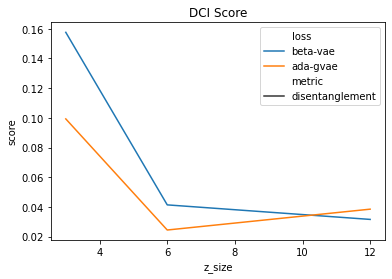

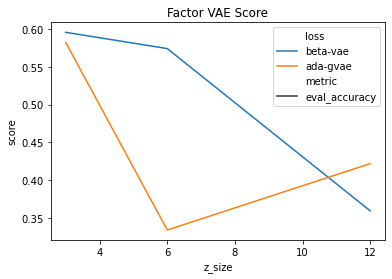

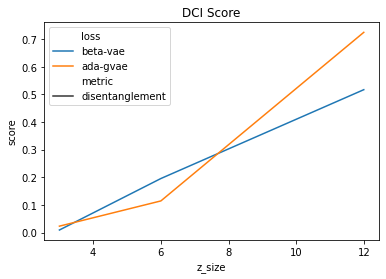

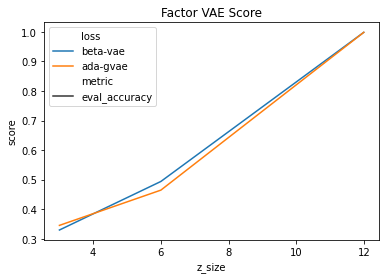

In [9]:
df_dci = get_dci_scores(dataset='dsprites')
df_dci = df_dci.melt(id_vars=['z_size', 'loss'], value_vars=['disentanglement'], var_name="metric", value_name="score")

sns.lineplot(x="z_size", y="score", hue="loss", style='metric', data=df_dci)
plt.title('DCI Score')
plt.show()

df_factor_vae = get_factor_vae_scores(dataset='dsprites')
df_factor_vae = df_factor_vae.melt(id_vars=['z_size', 'loss'], value_vars=['eval_accuracy'], var_name="metric", value_name="score")

sns.lineplot(x="z_size", y="score", hue="loss", style='metric', data=df_factor_vae)
plt.title('Factor VAE Score')
plt.show()



df_dci = get_dci_scores(dataset='3dshapes')
df_dci = df_dci.melt(id_vars=['z_size', 'loss'], value_vars=['disentanglement'], var_name="metric", value_name="score")

sns.lineplot(x="z_size", y="score", hue="loss", style='metric', data=df_dci)
plt.title('DCI Score')
plt.show()

df_factor_vae = get_factor_vae_scores(dataset='3dshapes')
df_factor_vae = df_factor_vae.melt(id_vars=['z_size', 'loss'], value_vars=['eval_accuracy'], var_name="metric", value_name="score")

sns.lineplot(x="z_size", y="score", hue="loss", style='metric', data=df_factor_vae)
plt.title('Factor VAE Score')
plt.show()

In [68]:
PATH = 'data/models/temp.ckpt'
system = train_system(loss='beta-vae', dataset='xygrid', model='simple-fc', epochs=5, z_size=2, load_path=PATH, train=True).cuda()
# notebook_display_latent_cycle(system)
# plot_system_mean_and_var(system, 1000)
# plt_sample_observations_and_reconstruct(system, num_samples=16);

INFO:lightning:GPU available: True, used: True
INFO:lightning:VISIBLE GPUS: 0
INFO:lightning:
   | Name                               | Type                        | Params
-------------------------------------------------------------------------------
0  | model                              | GaussianEncoderDecoderModel | 4 M   
1  | model._gaussian_encoder            | EncoderSimpleFC             | 2 M   
2  | model._gaussian_encoder.model      | Sequential                  | 2 M   
3  | model._gaussian_encoder.model.0    | Flatten3D                   | 0     
4  | model._gaussian_encoder.model.1    | Linear                      | 2 M   
5  | model._gaussian_encoder.model.2    | ReLU                        | 0     
6  | model._gaussian_encoder.model.3    | Linear                      | 24 K  
7  | model._gaussian_encoder.model.4    | ReLU                        | 0     
8  | model._gaussian_encoder.enc3mean   | Linear                      | 258   
9  | model._gaussian_encoder.enc3log

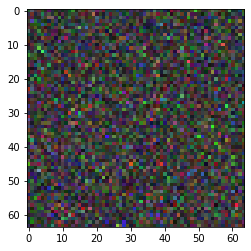

In [71]:
# system.model.sample_from_latent_distribution()

images = system.model.decode(torch.randn(20, system.hparams.z_size).cuda())
images = reconstructions_to_images(images)

from disent.visualize.visualize_util import reconstructions_to_images
image = (images[0] - np.min(images[0])) / (np.max(images[0]) - np.min(images[0]))

plt.imshow(image)

# DECAY EXPERIMENTS

In [8]:
PATH = 'data/trained-e10-dsprites-simple-fc-z12-betavae-decay.ckpt'
system = train_system(loss='beta-vae', dataset='dsprites', epochs=10, model='simple-fc', z_size=12, decay=True, load_path=PATH, train=False).cuda()
notebook_display_latent_cycle(system)
plot_system_mean_and_var(system, 1000)
plt_sample_observations_and_reconstruct(system, num_samples=16);

PATH = 'data/trained-e10-dsprites-simple-fc-z6-betavae-decay.ckpt'
system = train_system(loss='beta-vae', dataset='dsprites', epochs=10, model='simple-fc', z_size=6, decay=True, load_path=PATH, train=False).cuda()
notebook_display_latent_cycle(system)
plot_system_mean_and_var(system, 1000)
plt_sample_observations_and_reconstruct(system, num_samples=16);

PATH = 'data/trained-e10-dsprites-simple-fc-z12-adagvae-decay.ckpt'
system = train_system(loss='ada-gvae', dataset='dsprites', epochs=10, model='simple-fc', z_size=12, decay=True, load_path=PATH, train=False).cuda()
notebook_display_latent_cycle(system)
plot_system_mean_and_var(system, 1000)
plt_sample_observations_and_reconstruct(system, num_samples=16);

PATH = 'data/trained-e10-dsprites-simple-fc-z6-adagvae-decay.ckpt'
system = train_system(loss='ada-gvae', dataset='dsprites', epochs=10, model='simple-fc', z_size=6, decay=True, load_path=PATH, train=False).cuda()
notebook_display_latent_cycle(system)
plot_system_mean_and_var(system, 1000)
plt_sample_observations_and_reconstruct(system, num_samples=16);

RuntimeError: Error(s) in loading state_dict for VaeSystem:
	size mismatch for model._gaussian_encoder.model.1.weight: copying a param with shape torch.Size([192, 12288]) from checkpoint, the shape in current model is torch.Size([192, 4096]).
	size mismatch for model._decoder.model.4.weight: copying a param with shape torch.Size([12288, 192]) from checkpoint, the shape in current model is torch.Size([4096, 192]).
	size mismatch for model._decoder.model.4.bias: copying a param with shape torch.Size([12288]) from checkpoint, the shape in current model is torch.Size([4096]).

In [ ]:
PATH = 'data/trained-e10-3dshapes-simple-fc-z12-betavae-decay.ckpt'
system = train_system(loss='beta-vae', dataset='3dshapes', epochs=10, model='simple-fc', z_size=12, decay=True, load_path=PATH, train=False).cuda()
notebook_display_latent_cycle(system)
plot_system_mean_and_var(system, 1000)
plt_sample_observations_and_reconstruct(system, num_samples=16);

PATH = 'data/trained-e10-3dshapes-simple-fc-z6-betavae-decay.ckpt'
system = train_system(loss='beta-vae', dataset='3dshapes', epochs=10, model='simple-fc', z_size=6, decay=True, load_path=PATH, train=False).cuda()
notebook_display_latent_cycle(system)
plot_system_mean_and_var(system, 1000)
plt_sample_observations_and_reconstruct(system, num_samples=16);

PATH = 'data/trained-e10-3dshapes-simple-fc-z12-adagvae-decay.ckpt'
system = train_system(loss='ada-gvae', dataset='3dshapes', epochs=10, model='simple-fc', z_size=12, decay=True, load_path=PATH, train=False).cuda()
notebook_display_latent_cycle(system)
plot_system_mean_and_var(system, 1000)
plt_sample_observations_and_reconstruct(system, num_samples=16);

PATH = 'data/trained-e10-3dshapes-simple-fc-z6-adagvae-decay.ckpt'
system = train_system(loss='ada-gvae', dataset='3dshapes', epochs=10, model='simple-fc', z_size=6, decay=True, load_path=PATH, train=False).cuda()
notebook_display_latent_cycle(system)
plot_system_mean_and_var(system, 1000)
plt_sample_observations_and_reconstruct(system, num_samples=16);

INFO:lightning:GPU available: True, used: True
INFO:lightning:VISIBLE GPUS: 0
INFO:lightning:
   | Name                               | Type                        | Params
-------------------------------------------------------------------------------
0  | model                              | GaussianEncoderDecoderModel | 3 M   
1  | model._gaussian_encoder            | EncoderSimpleConv64         | 1 M   
2  | model._gaussian_encoder.model      | Sequential                  | 1 M   
3  | model._gaussian_encoder.model.0    | Conv2d                      | 544   
4  | model._gaussian_encoder.model.1    | ReLU                        | 0     
5  | model._gaussian_encoder.model.2    | Conv2d                      | 16 K  
6  | model._gaussian_encoder.model.3    | ReLU                        | 0     
7  | model._gaussian_encoder.model.4    | Conv2d                      | 32 K  
8  | model._gaussian_encoder.model.5    | ReLU                        | 0     
9  | model._gaussian_encoder.model.6


[MODEL]: saved data/trained-e5-dsprites-simple-conv-z12-betavae.ckpt


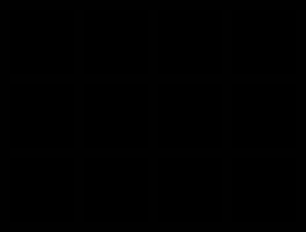

INFO:lightning:GPU available: True, used: True
INFO:lightning:VISIBLE GPUS: 0
INFO:lightning:
   | Name                               | Type                        | Params
-------------------------------------------------------------------------------
0  | model                              | GaussianEncoderDecoderModel | 3 M   
1  | model._gaussian_encoder            | EncoderSimpleConv64         | 1 M   
2  | model._gaussian_encoder.model      | Sequential                  | 1 M   
3  | model._gaussian_encoder.model.0    | Conv2d                      | 544   
4  | model._gaussian_encoder.model.1    | ReLU                        | 0     
5  | model._gaussian_encoder.model.2    | Conv2d                      | 16 K  
6  | model._gaussian_encoder.model.3    | ReLU                        | 0     
7  | model._gaussian_encoder.model.4    | Conv2d                      | 32 K  
8  | model._gaussian_encoder.model.5    | ReLU                        | 0     
9  | model._gaussian_encoder.model.6


[MODEL]: saved data/trained-e5-dsprites-simple-conv-z12-adagvae.ckpt


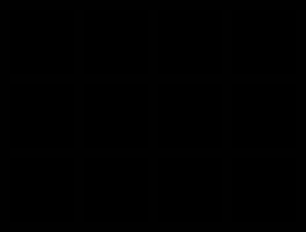

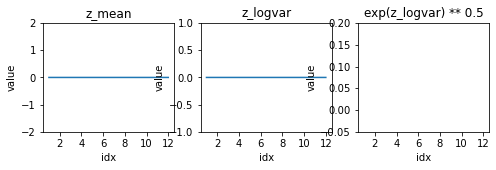

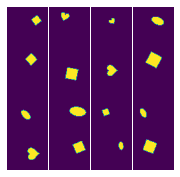

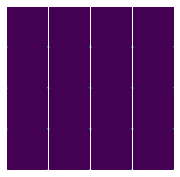

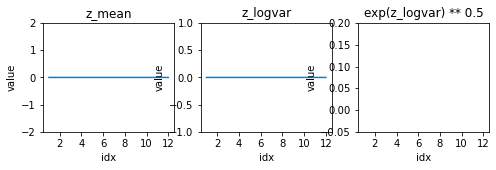

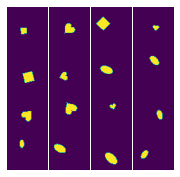

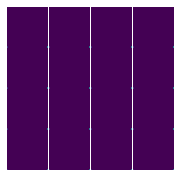

In [10]:
PATH = 'data/trained-e5-dsprites-simple-conv-z12-betavae.ckpt'
system = train_system(loss='beta-vae', dataset='dsprites', epochs=2, model='simple-conv', z_size=12, decay=False, save_path=PATH, train=True).cuda()
notebook_display_latent_cycle(system)
plot_system_mean_and_var(system, 1000)
plt_sample_observations_and_reconstruct(system, num_samples=16);

PATH = 'data/trained-e5-dsprites-simple-conv-z12-adagvae.ckpt'
system = train_system(loss='ada-gvae', dataset='dsprites', epochs=2, model='simple-conv', z_size=12, decay=False, save_path=PATH, train=True).cuda()
notebook_display_latent_cycle(system)
plot_system_mean_and_var(system, 1000)
plt_sample_observations_and_reconstruct(system, num_samples=16);